In [38]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import math
import random
import scipy.stats as stats

In [5]:
# import warnings

# # Suppress all warnings
# warnings.filterwarnings("ignore")

In [6]:
bse=pd.read_excel('bsedata1.xlsx')

In [7]:
nse=pd.read_excel('nsedata1.xlsx')

In [8]:
bse.head()

,Date,RELIANCE.BO,HDFCBANK.BO,AXISBANK.BO,HINDUNILVR.BO,ICICIBANK.BO,KOTAKBANK.BO,WIPRO.BO,ITC.BO,LT.BO,...,LUPIN.BO,YESBANK.BO,BLS.BO,GRASIM.BO,ULTRACEMCO.BO,ACC.BO,SHREECEM.BO,DABUR.BO,GODREJCP.BO,Stockex
0,2019-01-01,1126.000000,1061.500000,621.200012,1821.000000,362.000000,1251.150024,250.875000,283.750000,1449.000000,...,853.000000,182.850006,30.362499,827.049988,3987.550049,1519.0,17300.000000,434.350006,815.750000,NaN
1,2019-01-02,1116.000000,1072.500000,624.700012,1798.000000,362.649994,1245.500000,245.399994,282.899994,1442.800049,...,840.000000,183.750000,29.387501,824.500000,3992.949951,1499.5,17057.400391,424.950012,812.000000,36198.128906
2,2019-01-03,1108.050049,1063.000000,621.000000,1784.000000,365.000000,1245.900024,245.250000,280.649994,1426.500000,...,843.700012,185.649994,29.062500,818.000000,4000.300049,1485.0,16885.050781,415.899994,817.650024,35934.500000
3,2019-01-04,1098.000000,1055.574951,610.000000,1792.000000,361.500000,1234.599976,244.274994,279.500000,1401.000000,...,829.599976,184.550003,28.712500,805.099976,4000.000000,1463.0,16978.949219,424.700012,819.150024,35590.789062
4,2019-01-07,1105.150024,1062.525024,625.900024,1790.349976,368.299988,1251.900024,243.000000,283.350006,1400.000000,...,834.000000,194.250000,29.850000,812.000000,3960.000000,1479.0,17350.000000,422.700012,807.099976,35971.179688


In [9]:
bse.tail(30)

,Date,RELIANCE.BO,HDFCBANK.BO,AXISBANK.BO,HINDUNILVR.BO,ICICIBANK.BO,KOTAKBANK.BO,WIPRO.BO,ITC.BO,LT.BO,...,LUPIN.BO,YESBANK.BO,BLS.BO,GRASIM.BO,ULTRACEMCO.BO,ACC.BO,SHREECEM.BO,DABUR.BO,GODREJCP.BO,Stockex
1205,2023-11-16,2349.949951,1510.000000,1035.050049,2487.949951,938.049988,1774.949951,392.000000,441.649994,3064.949951,...,1181.000000,20.480000,273.149994,1943.699951,8778.000000,1836.000000,26100.000000,530.299988,985.049988,65665.867188
1206,2023-11-17,2357.350098,1498.849976,1017.400024,2474.949951,927.799988,1768.000000,398.000000,438.700012,3054.949951,...,1180.650024,20.139999,270.000000,1943.099976,8768.049805,1845.750000,26101.099609,538.950012,988.950012,65788.789062
1207,2023-11-20,2349.000000,1512.000000,984.799988,2530.050049,922.000000,1759.900024,391.549988,439.350006,3099.949951,...,1196.300049,20.930000,265.000000,1970.000000,8790.049805,1857.949951,26220.699219,541.049988,996.049988,65787.507812
1208,2023-11-21,2362.050049,1512.050049,988.750000,2507.800049,923.500000,1773.050049,402.250000,436.049988,3089.000000,...,1198.099976,20.270000,268.700012,1979.949951,8749.950195,1826.050049,26093.699219,543.250000,997.549988,65860.460938
1209,2023-11-22,2372.699951,1513.099976,991.650024,2505.250000,921.000000,1756.000000,403.000000,436.549988,3073.750000,...,1222.000000,19.730000,265.350006,1977.050049,8749.950195,1849.949951,26048.550781,541.000000,1001.950012,65839.617188
1210,2023-11-23,2387.750000,1509.800049,998.250000,2519.949951,924.349976,1745.000000,400.049988,440.500000,3081.899902,...,1224.949951,19.280001,265.700012,1980.000000,8774.950195,1814.300049,25972.800781,538.049988,1014.950012,66084.367188
1211,2023-11-24,2390.199951,1521.750000,1001.000000,2511.149902,922.250000,1739.949951,400.549988,441.000000,3059.000000,...,1223.949951,20.270000,263.149994,1960.000000,8610.049805,1839.199951,26008.449219,540.500000,1014.950012,66000.289062
1212,2023-11-28,2393.000000,1535.000000,1010.349976,2520.000000,927.549988,1748.000000,396.500000,437.799988,3054.000000,...,1245.000000,19.830000,265.250000,1952.099976,8624.950195,1827.050049,25600.000000,537.000000,1009.500000,66063.718750
1213,2023-11-29,2405.149902,1533.199951,1022.049988,2509.899902,928.549988,1750.000000,398.850006,436.000000,3052.899902,...,1250.050049,19.770000,263.500000,1980.800049,8750.000000,1891.949951,26132.699219,535.000000,1001.450012,66381.257812
1214,2023-11-30,2398.000000,1565.449951,1061.050049,2520.000000,940.950012,1748.000000,406.250000,437.200012,3080.050049,...,1250.000000,19.860001,260.450012,2018.949951,8760.549805,1889.949951,26204.900391,534.900024,996.150024,66963.203125


In [10]:
bse.shape


(1235, 22)

In [11]:
nse.shape


(1235, 22)

In [12]:
bse.shape[1]

22

In [13]:
#1a

In [14]:
def vol(df,d):
    df=df.tail(d)
    df=df.iloc[:,1:]
    df=df.pct_change()
    std=df.std()
    a=252
    return (std*(a**0.5))

In [15]:
print(vol(bse,30))

RELIANCE.BO      0.141151
HDFCBANK.BO      0.155207
AXISBANK.BO      0.241761
HINDUNILVR.BO    0.153415
ICICIBANK.BO     0.213157
KOTAKBANK.BO     0.156824
WIPRO.BO         0.280105
ITC.BO           0.192786
LT.BO            0.227564
SBIN.BO          0.259755
TRENT.BO         0.299415
LUPIN.BO         0.322279
YESBANK.BO       0.517560
BLS.BO           0.446472
GRASIM.BO        0.206223
ULTRACEMCO.BO    0.222318
ACC.BO           0.421034
SHREECEM.BO      0.190542
DABUR.BO         0.154714
GODREJCP.BO      0.212846
Stockex          0.118318
dtype: float64


In [16]:
print(vol(nse,30))

ADANIPORTS.NS    0.643415
ASIANPAINT.NS    0.133546
AXISBANK.NS      0.259755
BAJAJ-AUTO.NS    0.206790
BAJFINANCE.NS    0.193770
BPCL.NS          0.356316
CIPLA.NS         0.239966
COALINDIA.NS     0.331951
HDFCBANK.NS      0.171500
HEROMOTOCO.NS    0.293146
ZYDUSLIFE.NS     0.279187
COLPAL.NS        0.259077
BHEL.NS          0.501560
JSWENERGY.NS     0.501785
CANBK.NS         0.290185
NAUKRI.NS        0.318743
BOSCHLTD.NS      0.200800
NHPC.NS          0.486321
AUROPHARMA.NS    0.325675
IDFCFIRSTB.NS    0.269117
Stockex          0.113614
dtype: float64


In [17]:
vol(nse,30)[2]

0.2597550781357155

In [18]:
print(nse.iloc[2,:])

Date             2019-01-03 00:00:00
ADANIPORTS.NS             382.399994
ASIANPAINT.NS            1381.800049
AXISBANK.NS               621.400024
BAJAJ-AUTO.NS            2690.100098
BAJFINANCE.NS                 2612.0
BPCL.NS                        352.0
CIPLA.NS                       516.5
COALINDIA.NS              238.699997
HDFCBANK.NS              1062.099976
HEROMOTOCO.NS                 3032.0
ZYDUSLIFE.NS              345.049988
COLPAL.NS                     1301.0
BHEL.NS                         73.0
JSWENERGY.NS                    70.5
CANBK.NS                  275.899994
NAUKRI.NS                     1431.0
BOSCHLTD.NS                  19510.0
NHPC.NS                        25.75
AUROPHARMA.NS                  721.0
IDFCFIRSTB.NS              42.650002
Stockex                 10796.799805
Name: 2, dtype: object


In [19]:
#1b

In [20]:
def W(t):
  return np.random.normal(0,np.power(t,0.5))

In [21]:
def d(sign,t,x,r,K,sigma):
  a=1/(sigma*np.power(t,0.5))
  b=np.log(x/K)+r
  c=(sigma**2)*t/2
  return a*(b+sign*c)

In [22]:
def N(x):
  return stats.norm.cdf(x)


In [23]:
def C(t,s,T,r,K,sigma):
  #rint(f"N(d)={N((d(+1,T-t,s,r,K,sigma)))}")
  a=s*N(d(+1,T-t,s,r,K,sigma))
  #rint(f"a={a}")
  b=K*np.power(np.e,-r*(T-t))*N(d(-1,T-t,s,r,K,sigma))
  #rint(f"b={b}")
  return a-b

In [24]:
def P(t,s,T,r,K,sigma):
  a=s-np.power(np.e,-r*(T-t))*K
  return C(t,s,T,r,K,sigma)-a

In [25]:
C=np.vectorize(C)
P=np.vectorize(P)

In [26]:
r=0.05
T=0.5

In [27]:
bse.iloc[-1,1]

2608.050048828125

In [58]:
def bsm(df,d):
    sigma=vol(df,d)
    tables=[]
    for column in range(df.shape[1]-1):
        call=[]
        put=[]
        A=np.arange(0.5,1.5,0.1)
        for a in A:
            S0=df.iloc[-1,column+1]
            K=a*S0
            call.append(C(0,S0,T,r,K,sigma[column]))
            put.append(P(0,S0,T,r,K,sigma[column]))
        table=pd.DataFrame({
            'A':A,
            'Call value':call,
            'Put value':put
        })
        title=pd.DataFrame({
            'Company':[str(df.columns[column+1])]
        },index=[0])
        table=pd.concat([title,table])
        print(table)

In [59]:
bsm(bse,30)

       Company    A            Call value              Put value
0  RELIANCE.BO  NaN                   NaN                    NaN
0          NaN  0.5    1336.2215169841047  3.410605131648481e-12
1          NaN  0.6    1081.8558114149544  7.996575277502416e-07
2          NaN  0.7     827.4924452777357  0.0023410312435316882
3          NaN  0.8     573.5188162088243     0.3944183311366487
4          NaN  0.9    328.67725341060986      9.918561901727116
5          NaN  1.0      134.974951733828      70.58196659374994
6          NaN  1.1     35.29355519416504     225.26627642289168
7          NaN  1.2     5.608312685148064     449.94674028267895
8          NaN  1.3    0.5305549613356533      699.2346889276716
9          NaN  1.4  0.026211937458237244       953.096052272599
       Company    A           Call value              Put value
0  HDFCBANK.BO  NaN                  NaN                    NaN
0          NaN  0.5     871.985622595149  3.071818355238065e-10
1          NaN  0.6    705.9

    Company    A          Call value            Put value
0  LUPIN.BO  NaN                 NaN                  NaN
0       NaN  0.5   686.9195975090911  0.04420178105942796
1       NaN  0.6   556.8225955983078   0.7021256074821167
2       NaN  0.7  430.11808744578354    4.752543192164012
3       NaN  0.8  313.13126161235004    18.52064309593652
4       NaN  0.9  213.64020235834414    49.78450957913674
5       NaN  1.0  136.68014569492982   103.57937865292831
6       NaN  1.1   82.41172687091921   180.06588556612382
7       NaN  1.2   47.17413817519849     275.583222607609
8       NaN  1.3  25.838965042812845    385.0029752124295
9       NaN  1.4  13.644996751710096    503.5639326585331
      Company    A          Call value            Put value
0  YESBANK.BO  NaN                 NaN                  NaN
0         NaN  0.5  10.787729329850983  0.04897767697380395
1         NaN  0.6   8.877087749839774  0.18258558328169094
2         NaN  0.7   7.128135010277285  0.47788233003829816
3   

In [60]:
bsm(nse,30)

         Company    A          Call value           Put value
0  ADANIPORTS.NS  NaN                 NaN                 NaN
0            NaN  0.5   531.2497456965652   7.735586006052245
1            NaN  0.6   444.2784932101506   20.42149914012873
2            NaN  0.7  366.47429305598644  42.274464606455695
3            NaN  0.8   298.9409128675509   74.39825003851138
4            NaN  0.9  241.74298117104127  116.85748396249289
5            NaN  1.0  194.21896284468517  168.99063125662803
6            NaN  1.1   155.3064562058692   229.7352902383032
7            NaN  1.2   123.7924606812474   297.8784603341724
8            NaN  1.3    98.4751332993145  372.21829857273076
9            NaN  1.4     78.253261280495   451.6535921744025
         Company    A           Call value               Put value
0  ASIANPAINT.NS  NaN                  NaN                     NaN
0            NaN  0.5   1747.0965999916932  2.2737367544323206e-13
1            NaN  0.6    1414.515920139879  1.498474375

     Company    A          Call value             Put value
0  COLPAL.NS  NaN                 NaN                   NaN
0        NaN  0.5  1288.9861984975805  0.002869552125048358
1        NaN  0.6  1043.7707066917817   0.16073148848522578
2        NaN  0.7    800.673554443483     2.436932982345297
3        NaN  0.8   568.7720024576215    15.908734738642806
4        NaN  0.9  366.68259695664983      59.1926829798299
5        NaN  1.0  212.44473285528625    150.32817262062485
6        NaN  1.1   110.7801829128972    294.03697642039526
7        NaN  1.2   52.46430324003518     481.0944504896913
8        NaN  1.3  22.846359476311306      696.849860468127
9        NaN  1.4   9.266487825740029     928.6433425597146
   Company    A          Call value           Put value
0  BHEL.NS  NaN                 NaN                 NaN
0      NaN  0.5   98.71203525152126  0.3674056219934698
1      NaN  0.6   81.08049903576999  1.4569428699850846
2      NaN  0.7   64.87719895980197   3.974716257759951


In [31]:
#1c

In [55]:
def plotbsm(df):
    D=np.arange(30,df.shape[0],30)
    A=np.arange(0.5,1.5,0.1)
    for column in range(df.shape[1]-1):
    #for column in range(5):
        for a in A:
            sigma=[]
            call=[]
            put=[]
            for d in D:
                #print(df.iloc[:,column+1])
                returns=df.iloc[:,column+1].tail(d).pct_change()
                std=returns.std()
                sigma.append(std*(252**0.5))
                S0=df.iloc[-1,column+1]
                K=a*S0
                call.append(C(0,S0,T,r,K,sigma[len(sigma)-1]))
                put.append(P(0,S0,T,r,K,sigma[len(sigma)-1]))
            fig,(ax1,ax2)=plt.subplots(1,2)
            ax1.plot(np.arange(1,df.shape[0]/30,1),sigma,'r-')
            ax1.set_title(str(df.columns[column+1]))
            ax1.set_xlabel('time(in months)')
            ax1.set_ylabel('Volatility')
            #ax1.legend()

            ax2.plot(np.arange(1,df.shape[0]/30,1),call,'r-')
            ax2.plot(np.arange(1,df.shape[0]/30,1),put,'b-')
            ax2.set_title(str(df.columns[column+1]))
            ax2.set_xlabel('time(in months)')
            ax2.set_ylabel('Option price')
            #ax2.legend()

            plt.tight_layout()
            plt.show()

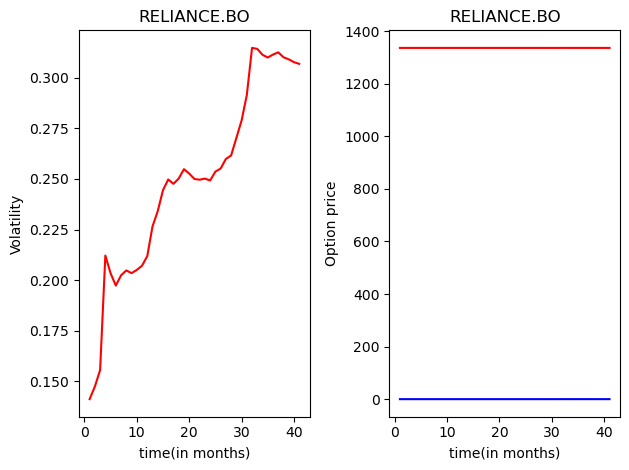

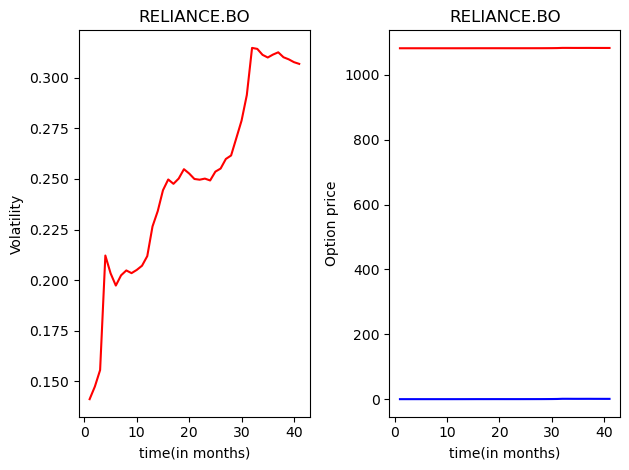

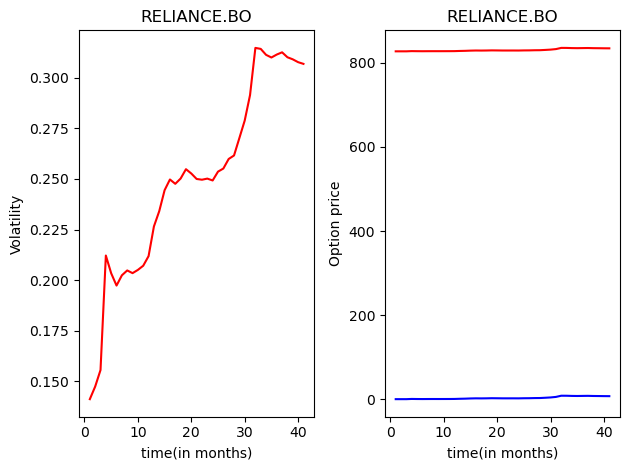

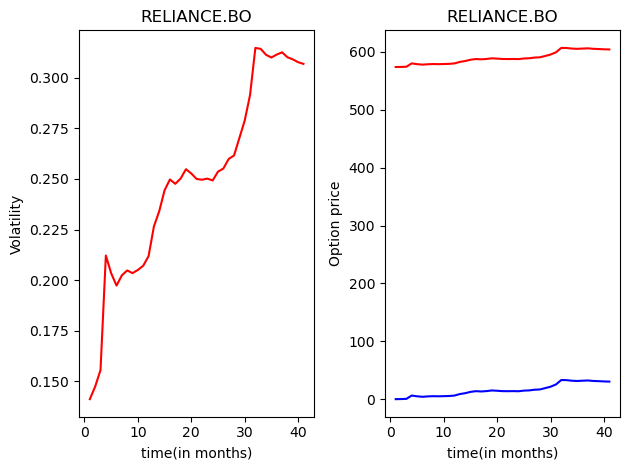

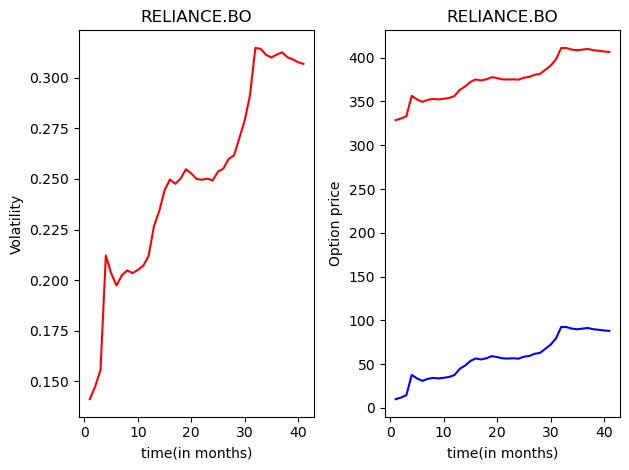

...

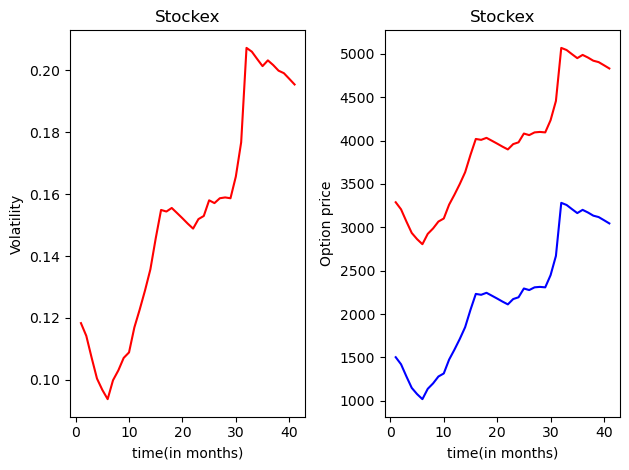

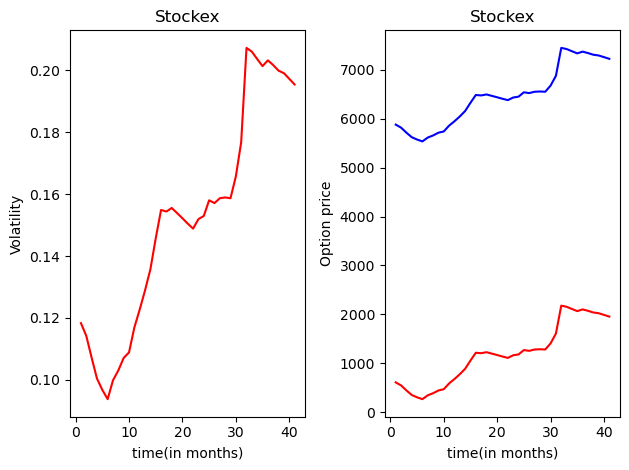

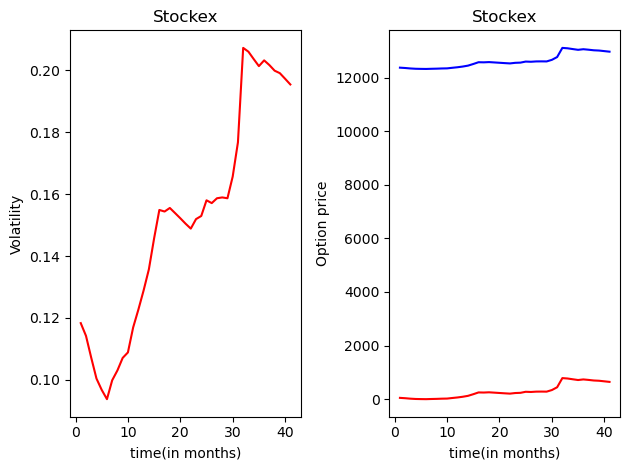

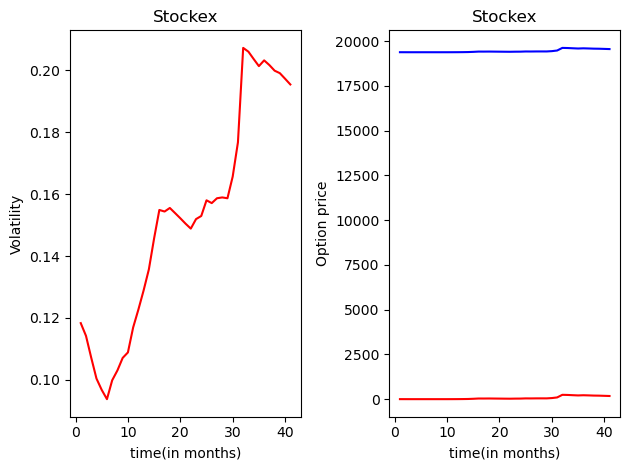

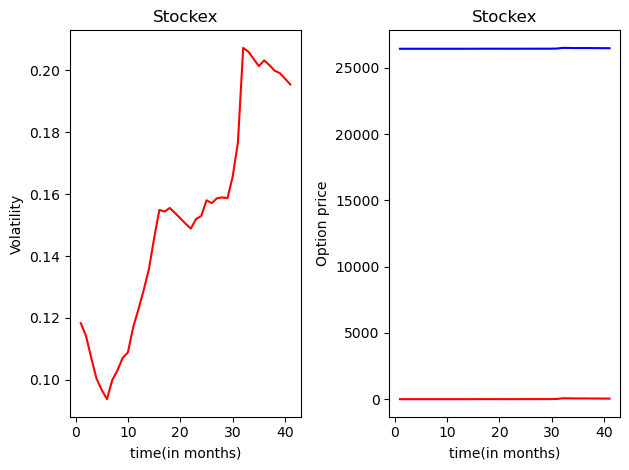

In [56]:
plotbsm(bse)

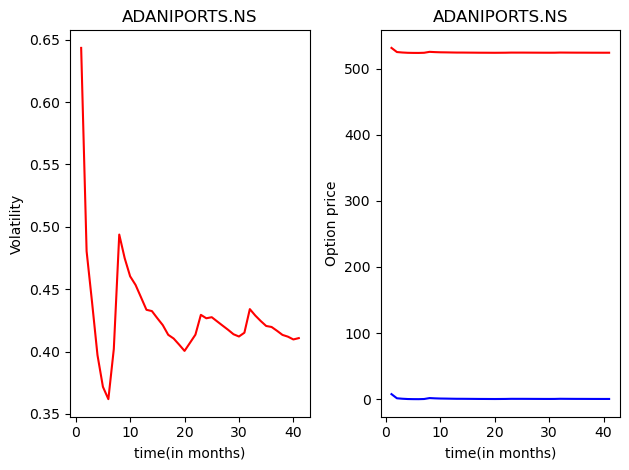

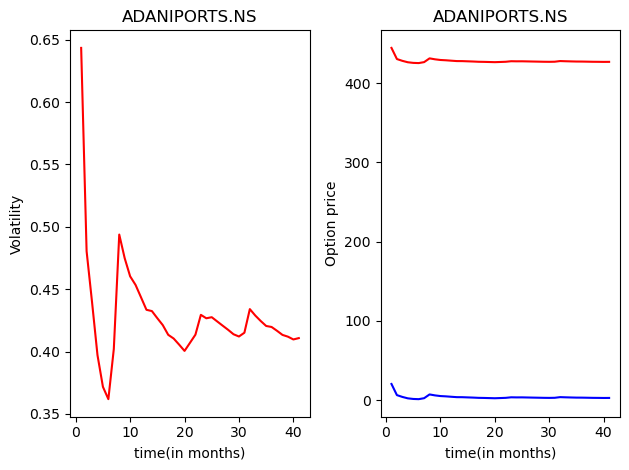

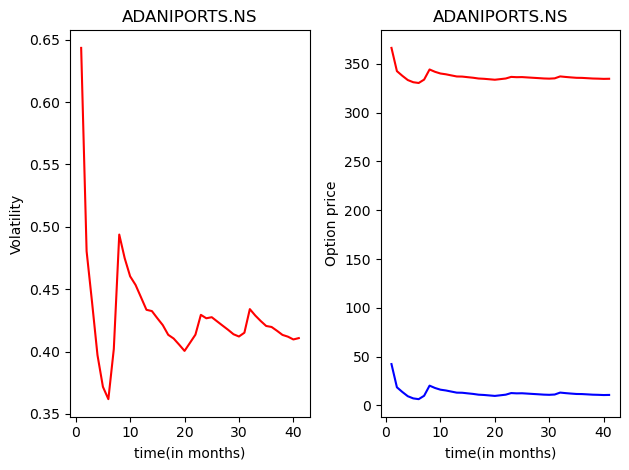

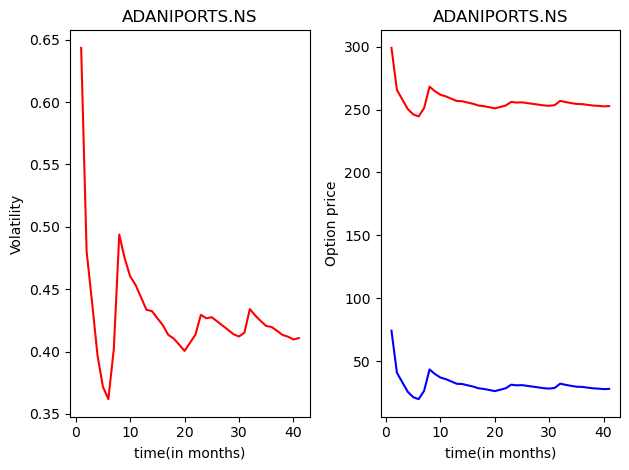

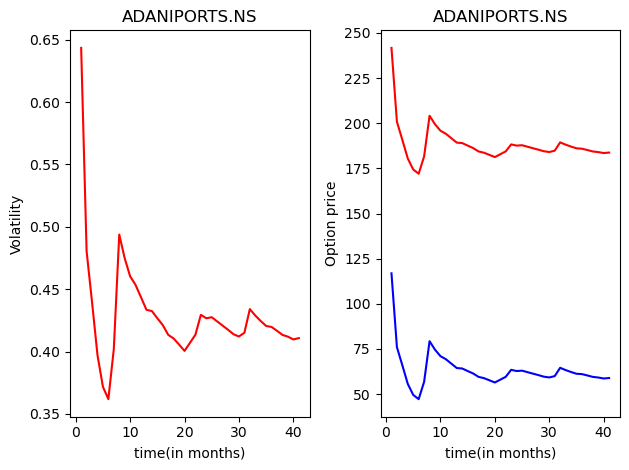

...

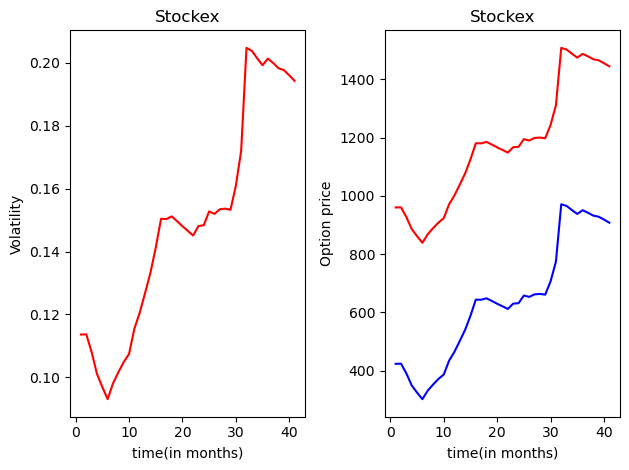

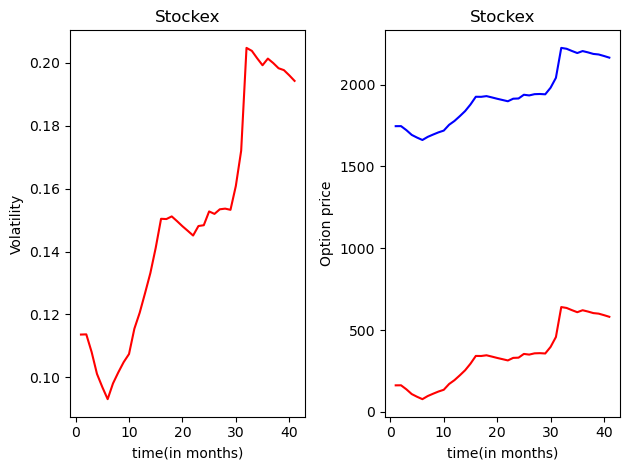

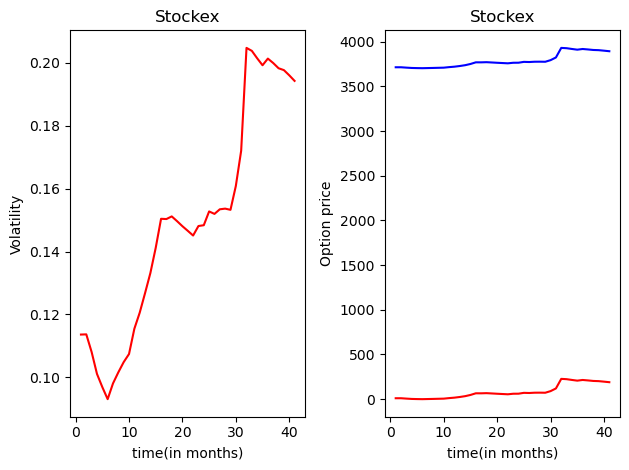

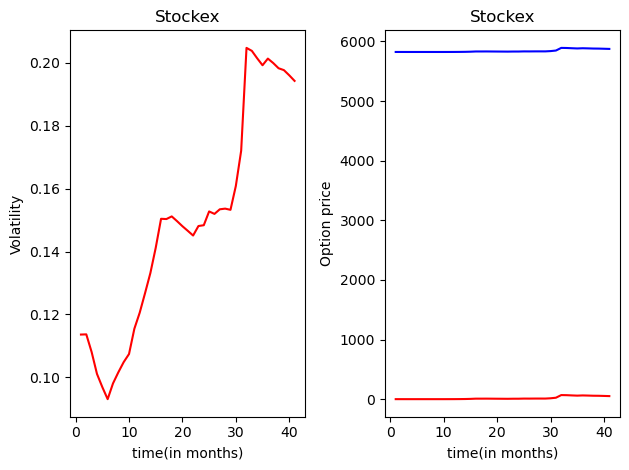

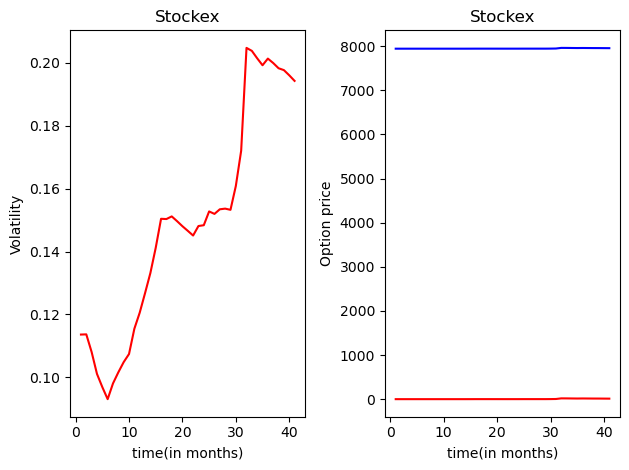

In [57]:
plotbsm(nse)